In [1]:
import tensorflow as tf
import tensorflow_decision_forests as tfdf

/Users/levikanteti/webscraping_eliot/.venv/lib/python3.9/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
tf.debugging.set_log_device_placement(True)


In [3]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
#from tensorflow.keras.models import Model
#from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Add
#from tensorflow.keras.optimizers import Adam
#from tensorflow.keras.regularizers import l2
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, max_error, median_absolute_error
from sklearn.metrics import root_mean_squared_error


In [4]:
import glob
import json
import csv
import pandas as pd
import numpy as np
import seaborn as sns
from itertools import product
import tensorflow as tf
import tensorflow_decision_forests as tfdf


import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.feature_selection import VarianceThreshold
from matplotlib.ticker import ScalarFormatter


import plotly.express as px

from sklearn.metrics import (
    mean_absolute_error,       # MAE
    mean_squared_error,        # MSE
    r2_score,                  # R-squared (R²)
)



In [5]:
file_path_singular = 'webscraping_USPS/csv_results/file_ak.csv'

In [6]:
imported_single = pd.read_csv(file_path_singular, skiprows=5, header=0)
# skipping first 5 rows because of how it looks in excel and keeping the 4th row as header

In [7]:
imported_single = imported_single.drop(imported_single.tail(2).index)

In [8]:
imported_single

,District,PO Name,Unit Name,Property Address,County,City,ST,ZIP Code,Ownership,FDB Facility Type (All),FDB Facility Subtype (All),Bldg Occu Date,Int Sq Ft
0,ALASKA,AKIAK,MAIN OFFICE BLDG,250 OFF DOOPS ST,BETHEL,AKIAK,AK,99552-9800,Owned,NaN,NaN,3/1/2002,"2,075"
1,ALASKA,AMBLER,MAIN OFFICE,9998 AMBLER AVE,NORTHWEST ARCTIC,AMBLER,AK,99786-9800,Owned,Post Office,Part Time Post Office (PTPO),2/1/1986,480
2,ALASKA,ANAKTUVUK PASS,MAIN OFFICE BLDG,1104 SUMMER ST,NORTHWEST ARCTIC,ANAKTUVUK PASS,AK,99721-9800,Owned,Post Office,Part Time Post Office (PTPO),11/1/2007,"1,262"
3,ALASKA,ANCHORAGE,EASTCHESTER STATION,800 INGRA ST,ANCHORAGE,ANCHORAGE,AK,99501-9998,Owned,Post Office,Station,10/1/1985,"14,840"
4,ALASKA,ANCHORAGE,HUFFMAN STATION SOUTH,1221 HUFFMAN PARK DR,ANCHORAGE,ANCHORAGE,AK,99515-9998,Owned,Post Office,Station,7/1/1985,"14,840"
...,...,...,...,...,...,...,...,...,...,...,...,...,...
126,ALASKA,WASILLA,CARRIER ANNEX,626 N BOBBY DAY CIR,MATANUSKASUSITNA,WASILLA,AK,99654-7369,Owned,Post Office,Carrier Annex (ANX),8/1/1983,"10,755"
127,ALASKA,WASILLA,MAIN OFFICE,401 N MAIN ST,MATANUSKASUSITNA,WASILLA,AK,99654-9998,Owned,Post Office,Main Post Office,8/1/1983,"12,723"
128,ALASKA,WHITE MOUNTAIN,MAIN OFFICE,100 MAIN ST,NOME,WHITE MOUNTAIN,AK,99784-9800,Owned,Post Office,Part Time Post Office (PTPO),1/1/1985,429
129,ALASKA,WILLOW,MAIN OFFICE,13232 N MCKINLEY WAY,MATANUSKASUSITNA,WILLOW,AK,99688-9800,Owned,Post Office,Main Post Office,6/1/1998,"3,953"


### Above was just a test to make sure I'm propery cleaning the data

In [9]:
csv_dir = "webscraping_USPS/csv_results/"

In [10]:
csv_files = glob.glob(f"{csv_dir}/*.csv")

In [11]:
merged_df = pd.DataFrame()

In [12]:
for iter, file_path in enumerate(csv_files):
    df = pd.read_csv(file_path, skiprows = 5, header = 0)
    df = df.drop(df.tail(2).index)

    if iter == 0:
        # first
        merged_df = df
    else:
        # not first dataframe (this avoids duplicate index's)
        merged_df = pd.concat([merged_df, df], ignore_index=True)

In [13]:
pd.set_option('display.max_columns', None)

In [14]:
merged_df

,District,PO Name,Unit Name,Property Address,County,City,ST,ZIP Code,Ownership,FDB Facility Type (All),FDB Facility Subtype (All),Bldg Occu Date,Int Sq Ft,Fin-Sub,Property Status,OHIO 1,AKRON,FIRESTONE PARK STA,2001 BROWN ST,SUMMIT,AKRON.1,OH,44319-9998,Owned,Post Office,Station,2/1/1987,"15,877",Unnamed: 13
0,OHIO 2,ABERDEEN,MAIN OFFICE,720 US HIGHWAY 52,BROWN,ABERDEEN,OH,45101-9998,Owned,Post Office,Main Post Office,6/1/1988,"1,687",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,OHIO 1,ADA,MAIN OFFICE,131 S MAIN ST,HARDIN,ADA,OH,45810-9998,Owned,Post Office,Administrative Post Office (APO),4/1/1938,"6,720",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,OHIO 1,AKRON,COPLEY BRANCH,3840 RIDGEWOOD RD,SUMMIT,COPLEY,OH,44321-9998,Owned,Post Office,Branch,6/1/1999,"6,570",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,OHIO 1,AKRON,ELLET STA,2390 WEDGEWOOD DR,SUMMIT,AKRON,OH,44312-9998,Owned,Post Office,Station,9/1/1979,"8,750",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,OHIO 1,AKRON,FIRESTONE PARK STA,2001 BROWN ST,SUMMIT,AKRON,OH,44319-9998,Owned,Post Office,Station,2/1/1987,"15,877",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19478,ID-MT-OR,TRAIL,MAIN OFFICE MODULAR,100 OLD HIGHWAY 62,JACKSON,TRAIL,OR,97541-9749,Owned,Post Office,Remotely Managed Post Office (RMPO),2/1/1999,915,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19479,ID-MT-OR,TUALATIN,POSTAL RETAIL STORE,19190 SW 90th AVE,WASHINGTON,TUALATIN,OR,97062-9997,Owned,Post Office,Main Post Office,NaN,"10,700",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19480,ID-MT-OR,TUALATIN,DELIVERY CARRIER UNIT,18850 SW TETON AVE,WASHINGTON,TUALATIN,OR,97062-8806,Owned,Post Office,Carrier Annex (ANX),6/1/1999,"14,781",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
19481,ID-MT-OR,WARM SPRINGS,MAIN OFFICE,2128 WARM SPRINGS RD,JEFFERSON,WARM SPRINGS,OR,97761-9700,Owned,Post Office,Main Post Office,8/1/1986,"2,475",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [15]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19483 entries, 0 to 19482
Data columns (total 29 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   District                    9785 non-null   object
 1   PO Name                     9784 non-null   object
 2   Unit Name                   9785 non-null   object
 3   Property Address            9782 non-null   object
 4   County                      9782 non-null   object
 5   City                        9785 non-null   object
 6   ST                          9785 non-null   object
 7   ZIP Code                    9785 non-null   object
 8   Ownership                   9785 non-null   object
 9   FDB Facility Type (All)     9550 non-null   object
 10  FDB Facility Subtype (All)  9550 non-null   object
 11  Bldg Occu Date              9366 non-null   object
 12  Int Sq Ft                   9785 non-null   object
 13  Fin-Sub                     1 non-null      ob

In [16]:
unique_districts = merged_df['District'].unique()
print(unique_districts)

['OHIO 2' 'OHIO 1' 'CO-WY' 'MA-RI' 'AZ-NM' 'AR-OK' 'ID-MT-OR'
 'PUERTO RICO' 'NEW YORK 3' 'NEW YORK 2' 'NEW YORK 1' 'NEW JERSEY'
 'WISCONSIN' 'HAWAII' 'ME-NH-VT' 'LOUISIANA' 'NV-UT' 'AL-MS' 'MARYLAND'
 'IA-NE-SD' 'GEORGIA' 'SOUTH CAROLINA' 'KS-MO' 'ILLINOIS 2' 'ILLINOIS 1'
 'INDIANA' 'DE-PA 2' 'PENNSYLVANIA 1' 'FLORIDA 1' 'FLORIDA 2' 'FLORIDA 3'
 nan 'KY-WV' 'MICHIGAN 2' 'MICHIGAN 1' 'MN-ND' 'ALASKA' 'CONNECTICUT'
 'CALIFORNIA 6' 'CALIFORNIA 3' 'CALIFORNIA 2' 'CALIFORNIA 4'
 'CALIFORNIA 1' 'CALIFORNIA 5' 'VIRGINIA' 'NORTH CAROLINA' 'WASHINGTON'
 'TENNESSEE' 'TEXAS 3' 'TEXAS 1' 'TEXAS 2']


In [17]:
columns_to_drop = [
    'Fin-Sub', 'Property Status', 'OHIO 1', 'AKRON', 'FIRESTONE PARK STA',
    '2001 BROWN ST', 'SUMMIT', 'AKRON.1', 'OH', '44319-9998', 'Owned',
    'Post Office', 'Station', '2/1/1987', '15,877', 'Unnamed: 13', 'Property Address', 
    'Ownership', 'FDB Facility Type (All)', 'FDB Facility Subtype (All)'
]

merged_df = merged_df.drop(columns=columns_to_drop)

In [18]:
merged_df

,District,PO Name,Unit Name,County,City,ST,ZIP Code,Bldg Occu Date,Int Sq Ft
0,OHIO 2,ABERDEEN,MAIN OFFICE,BROWN,ABERDEEN,OH,45101-9998,6/1/1988,"1,687"
1,OHIO 1,ADA,MAIN OFFICE,HARDIN,ADA,OH,45810-9998,4/1/1938,"6,720"
2,OHIO 1,AKRON,COPLEY BRANCH,SUMMIT,COPLEY,OH,44321-9998,6/1/1999,"6,570"
3,OHIO 1,AKRON,ELLET STA,SUMMIT,AKRON,OH,44312-9998,9/1/1979,"8,750"
4,OHIO 1,AKRON,FIRESTONE PARK STA,SUMMIT,AKRON,OH,44319-9998,2/1/1987,"15,877"
...,...,...,...,...,...,...,...,...,...
19478,ID-MT-OR,TRAIL,MAIN OFFICE MODULAR,JACKSON,TRAIL,OR,97541-9749,2/1/1999,915
19479,ID-MT-OR,TUALATIN,POSTAL RETAIL STORE,WASHINGTON,TUALATIN,OR,97062-9997,NaN,"10,700"
19480,ID-MT-OR,TUALATIN,DELIVERY CARRIER UNIT,WASHINGTON,TUALATIN,OR,97062-8806,6/1/1999,"14,781"
19481,ID-MT-OR,WARM SPRINGS,MAIN OFFICE,JEFFERSON,WARM SPRINGS,OR,97761-9700,8/1/1986,"2,475"


In [19]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19483 entries, 0 to 19482
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   District        9785 non-null   object
 1   PO Name         9784 non-null   object
 2   Unit Name       9785 non-null   object
 3   County          9782 non-null   object
 4   City            9785 non-null   object
 5   ST              9785 non-null   object
 6   ZIP Code        9785 non-null   object
 7   Bldg Occu Date  9366 non-null   object
 8   Int Sq Ft       9785 non-null   object
dtypes: object(9)
memory usage: 1.3+ MB


In [20]:
merged_df.describe()

,District,PO Name,Unit Name,County,City,ST,ZIP Code,Bldg Occu Date,Int Sq Ft
count,9785,9784,9785,9782,9785,9785,9785,9366,9785
unique,50,4989,2047,1498,5083,55,8417,1033,6145
top,KS-MO,CHICAGO,MAIN OFFICE,LOS ANGELES,CHICAGO,TX,20018-1004,6/1/1937,736
freq,382,60,5202,157,57,681,16,143,190


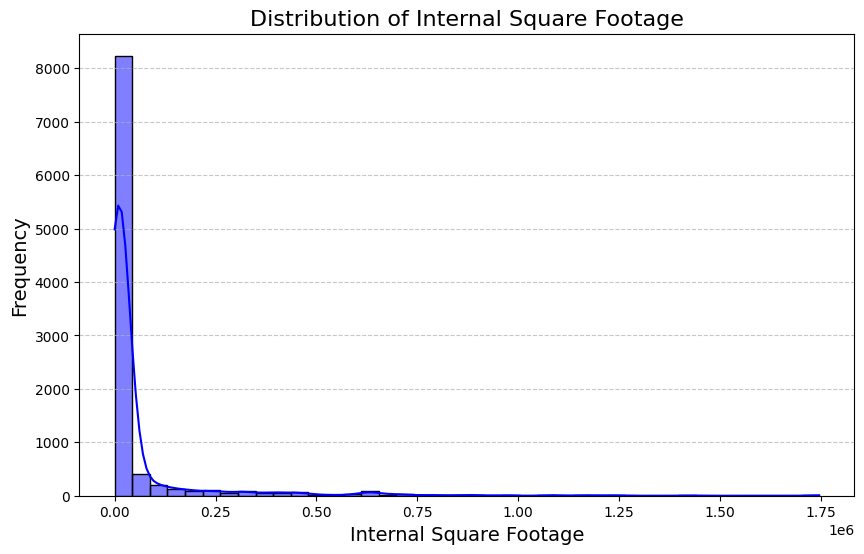

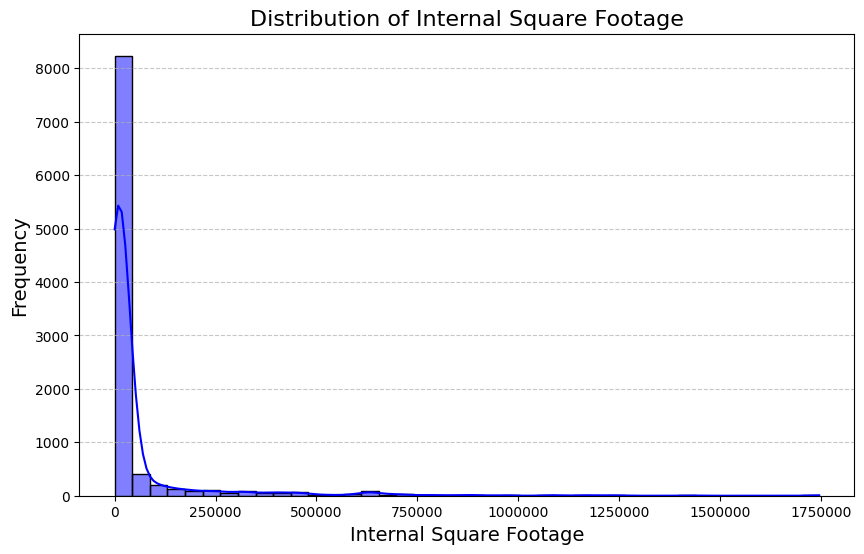

/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/3099781405.py:33: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=top_districts.values, y=top_districts.index, palette='viridis')


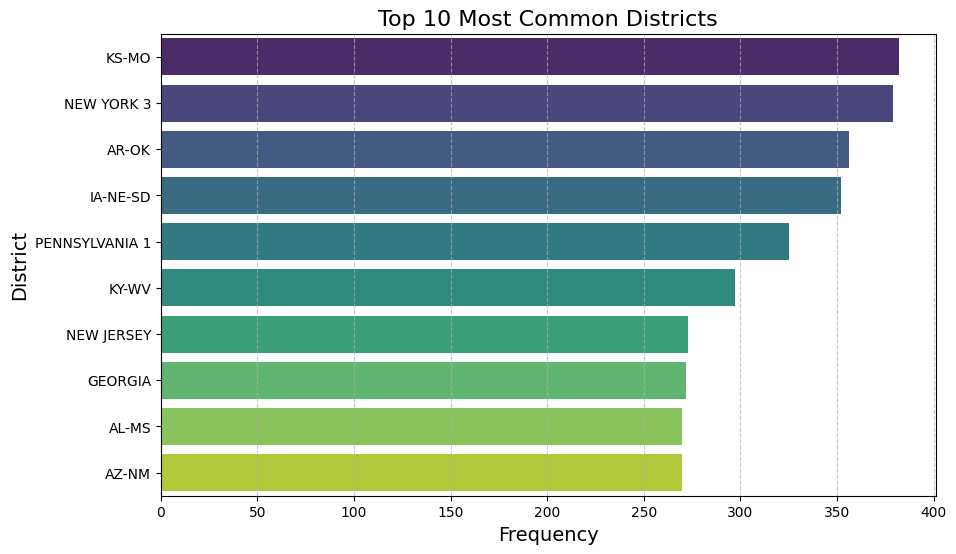

In [21]:
# Assuming merged_df is available and preprocessed
# Preprocess necessary columns
merged_df['Int Sq Ft'] = pd.to_numeric(merged_df['Int Sq Ft'].str.replace(',', ''), errors='coerce')
merged_df['Bldg Occu Date'] = pd.to_datetime(merged_df['Bldg Occu Date'], errors='coerce')

# Distribution of Internal Square Footage (Int Sq Ft)
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Int Sq Ft'], bins=40, kde=True, color='blue')
plt.title("Distribution of Internal Square Footage", fontsize=16)
plt.xlabel("Internal Square Footage", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

#Distribution of Internal Square Footage (Int Sq Ft)
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Int Sq Ft'], bins=40, kde=True, color='blue')
plt.title("Distribution of Internal Square Footage", fontsize=16)
plt.xlabel("Internal Square Footage", fontsize=14)
plt.ylabel("Frequency", fontsize=14)

# Use ScalarFormatter to avoid scientific notation
plt.gca().xaxis.set_major_formatter(ScalarFormatter())
plt.ticklabel_format(style='plain', axis='x')

plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


# Barplot of the top 10 most common Districts
top_districts = merged_df['District'].value_counts().head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x=top_districts.values, y=top_districts.index, palette='viridis')
plt.title("Top 10 Most Common Districts", fontsize=16)
plt.xlabel("Frequency", fontsize=14)
plt.ylabel("District", fontsize=14)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [22]:
# Distribution of Internal Square Footage (Interactive)
fig = px.histogram(
    merged_df, 
    x='Int Sq Ft', 
    nbins=4000, 
    title="Distribution of Internal Square Footage",
    labels={"Int Sq Ft": "Internal Square Footage"}
)
fig.update_traces(marker_color='blue', opacity=0.7)
fig.update_layout(
    xaxis_title="Internal Square Footage",
    yaxis_title="Frequency",
    title_font_size=16,
    xaxis=dict(tickformat=".0f")  # Remove scientific notation
)
fig.show()


In [23]:
# Step 1: Convert to lowercase, remove spaces, and strip white spaces
merged_df['County'] = merged_df['County'].str.lower().str.replace(' ', '').str.strip()

# Step 2: Handle null values by filling them with 'unknown'
merged_df['County'] = merged_df['County'].fillna('unknown')

# Step 3: One-hot encode the 'County' column
one_hot_encoded_df = pd.get_dummies(merged_df['County'], prefix='', prefix_sep='')

# Step 4: Rename the columns to include '_county'
one_hot_encoded_df.columns = [f"{col}_county" for col in one_hot_encoded_df.columns]

# Step 5: Concatenate the one-hot encoded columns back to the original DataFrame
merged_df = pd.concat([merged_df, one_hot_encoded_df], axis=1)

# Drop the original 'County' column if needed
merged_df = merged_df.drop(columns=['County'])

In [24]:
pd.set_option('display.max_columns', 30)

In [25]:
columns_to_process = [
    'District', 'PO Name', 'City', 'ST', 'ZIP Code', 'Unit Name'
]

for column in columns_to_process:
    # Step 1: Convert to lowercase, remove spaces, and strip white spaces
    merged_df[column] = merged_df[column].str.lower().str.replace(' ', '').str.strip()
    
    # Step 2: Handle null values by filling them with 'unknown'
    merged_df[column] = merged_df[column].fillna('unknown')
    
    # Step 3: One-hot encode the column
    one_hot_encoded_df = pd.get_dummies(merged_df[column], prefix='', prefix_sep='')
    
    # Step 4: Rename the columns to include '_<column_name>'
    one_hot_encoded_df.columns = [f"{col}_{column.lower().replace(' ', '_')}" for col in one_hot_encoded_df.columns]
    
    # Step 5: Concatenate the one-hot encoded columns back to the original DataFrame
    merged_df = pd.concat([merged_df, one_hot_encoded_df], axis=1)
    
    # Drop the original column if needed
    merged_df = merged_df.drop(columns=[column])

In [26]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19483 entries, 0 to 19482
Columns: 22008 entries, Bldg Occu Date to zebulonroadbranch_unit_name
dtypes: bool(22006), datetime64[ns](1), float64(1)
memory usage: 409.2 MB


In [27]:
flag_for_drop = True

In [28]:
if flag_for_drop:
    # Step 1: Ensure 'Int Sq Ft' is treated as a string for processing
    merged_df['Int Sq Ft'] = merged_df['Int Sq Ft'].astype(str).str.replace(',', '', regex=True)

    # Step 2: Convert to numeric and handle non-convertible values
    merged_df['Int Sq Ft'] = pd.to_numeric(merged_df['Int Sq Ft'], errors='coerce')

    # Step 3: Drop rows with missing or invalid 'Int Sq Ft' values
    merged_df = merged_df.dropna(subset=['Int Sq Ft'])

    # Step 4: Convert the column to int
    merged_df['Int Sq Ft'] = merged_df['Int Sq Ft'].astype(int)

    # Step 1: Convert the date strings to datetime objects
    merged_df['Bldg Occu Date'] = pd.to_datetime(merged_df['Bldg Occu Date'], format='%m/%d/%Y', errors='coerce')

    # Step 2: Drop rows with missing 'Bldg Occu Date' values
    merged_df = merged_df.dropna(subset=['Bldg Occu Date'])

    # Step 3: Calculate the number of days since the reference date
    reference_date = pd.to_datetime('1900-01-01')
    merged_df['Bldg Occu Date'] = (merged_df['Bldg Occu Date'] - reference_date).dt.days

else:
    # Step 1: Remove commas and convert to numeric
    merged_df['Int Sq Ft'] = merged_df['Int Sq Ft'].astype(str).str.replace(',', '', regex=True)

    # Step 2: Calculate the median value
    median_value = merged_df['Int Sq Ft'].median()
    print(median_value)

    new_median_value = 0

    # Step 3: Replace null values with the median value
    merged_df['Int Sq Ft'] = merged_df['Int Sq Ft'].fillna(new_median_value)

    # Step 4: Convert the column to int
    merged_df['Int Sq Ft'] = merged_df['Int Sq Ft'].astype(int)

    # Step 1: Convert the date strings to datetime objects
    merged_df['Bldg Occu Date'] = pd.to_datetime(merged_df['Bldg Occu Date'], format='%m/%d/%Y', errors='coerce')

    # Step 2: Calculate the number of days since the reference date
    reference_date = pd.to_datetime('1900-01-01')
    merged_df['Bldg Occu Date'] = (merged_df['Bldg Occu Date'] - reference_date).dt.days

    # Step 3: Calculate the median value
    median_value = merged_df['Bldg Occu Date'].median()
    print(median_value)

    # Step 4: Replace NaN values with the median value
    merged_df['Bldg Occu Date'] = merged_df['Bldg Occu Date'].fillna(new_median_value)

# Apply 1st and 99th percentile filtering for both 'Int Sq Ft' and 'Bldg Occu Date'
int_sq_ft_lower = merged_df['Int Sq Ft'].quantile(0.01)  # 1st percentile for 'Int Sq Ft'
int_sq_ft_upper = merged_df['Int Sq Ft'].quantile(0.88)  # 88th percentile for 'Int Sq Ft'

bldg_occu_lower = merged_df['Bldg Occu Date'].quantile(0.01)  # 1st percentile for 'Bldg Occu Date'
bldg_occu_upper = merged_df['Bldg Occu Date'].quantile(0.99)  # 99th percentile for 'Bldg Occu Date'

# Filter rows that are within the percentile ranges for both columns
merged_df = merged_df[
    (merged_df['Int Sq Ft'] >= int_sq_ft_lower) & (merged_df['Int Sq Ft'] <= int_sq_ft_upper) &
    (merged_df['Bldg Occu Date'] >= bldg_occu_lower) & (merged_df['Bldg Occu Date'] <= bldg_occu_upper)
]

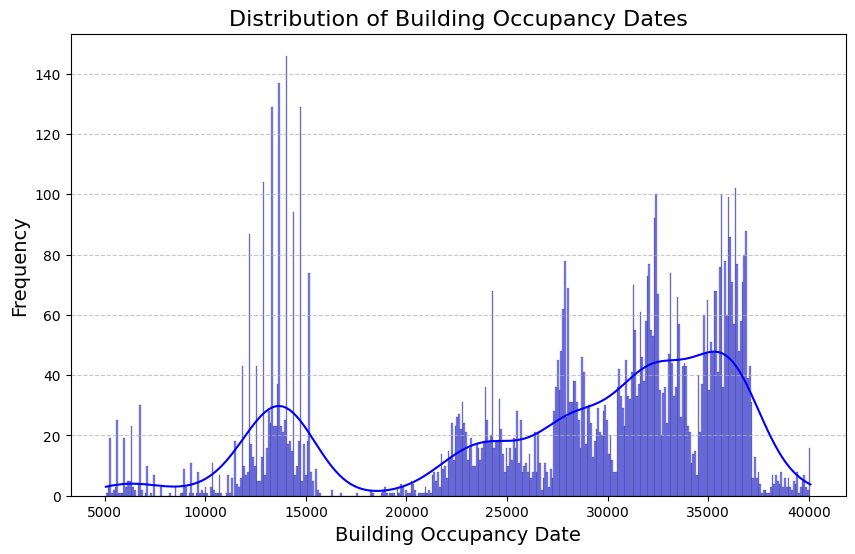

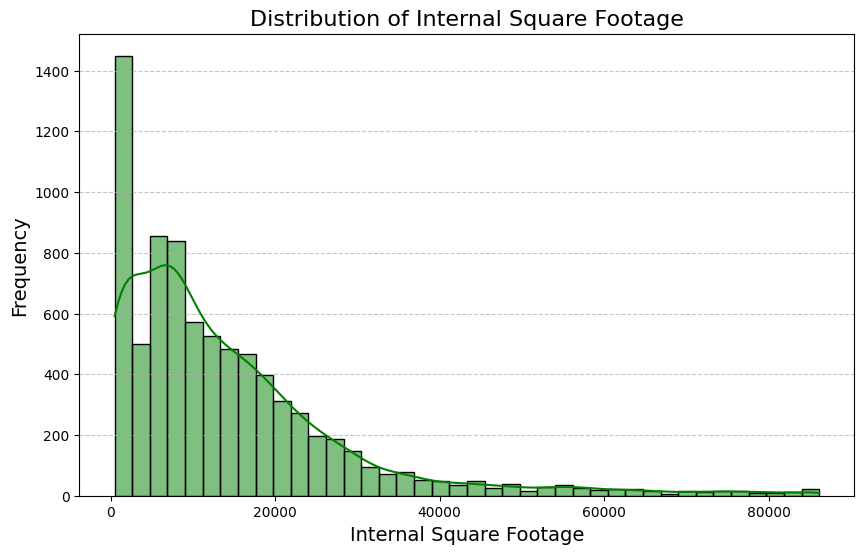

In [29]:
# Distribution of 'Bldg Occu Date'
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Bldg Occu Date'], bins=400, kde=True, color='blue')
plt.title("Distribution of Building Occupancy Dates", fontsize=16)
plt.xlabel("Building Occupancy Date", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Distribution of 'Int Sq Ft'
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['Int Sq Ft'], bins=40, kde=True, color='green')
plt.title("Distribution of Internal Square Footage", fontsize=16)
plt.xlabel("Internal Square Footage", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [30]:
# Reducing our dataset by removing columns that have low variance. (always T always F)
selector = VarianceThreshold(threshold=0.01)
reduced_data = selector.fit_transform(merged_df)

In [31]:
reduced_df = pd.DataFrame(reduced_data, columns=merged_df.columns[selector.get_support()])

In [32]:
# Split features and target
X_gb = reduced_df.drop(columns=['Bldg Occu Date']).copy()  # Features
y_gb = reduced_df['Bldg Occu Date'].copy()  # Target variable

# Train-test split
X_train_gb, X_test_gb, y_train_gb, y_test_gb = train_test_split(
    X_gb, y_gb, test_size=0.25, random_state=42
)

# Add the target variable back to the training and testing DataFrames
train_df = X_train_gb.copy()
train_df['Bldg Occu Date'] = y_train_gb

test_df = X_test_gb.copy()
test_df['Bldg Occu Date'] = y_test_gb

In [33]:
assert reduced_df.isnull().sum().sum() == 0, "Dataset contains missing values!"


### We're using Gradient Boosting Regressor

In [34]:
# Create copies of the dataframe to avoid overwriting
X_gb = reduced_df.drop(columns=['Bldg Occu Date']).copy()  # Features
y_gb = reduced_df['Bldg Occu Date'].copy()  # Target variable

# Split the data into training and testing sets
X_train_gb, X_test_gb, y_train_gb, y_test_gb = train_test_split(X_gb, y_gb, test_size=0.25, random_state=42)

# Initialize and train the Gradient Boosting model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train_gb, y_train_gb)

# Make predictions
y_pred_gb = gb_model.predict(X_test_gb)

# Evaluate the model using multiple metrics
mae_gb = mean_absolute_error(y_test_gb, y_pred_gb)
mse_gb = mean_squared_error(y_test_gb, y_pred_gb)
rmse_gb = root_mean_squared_error(y_test_gb, y_pred_gb)  # Root Mean Squared Error
median_ae_gb = median_absolute_error(y_test_gb, y_pred_gb)
max_err_gb = max_error(y_test_gb, y_pred_gb)
r2_gb = r2_score(y_test_gb, y_pred_gb)

Evaluation Metrics:
Mean Absolute Error (MAE): 5672.341616829004
Mean Squared Error (MSE): 52170639.49622439
Median Absolute Error: 4668.33962081276
Root Mean Squared Error (RMSE) 7222.924580543839
Max Error: 26544.563607520835
R2 Score: 0.31634088112837977


/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/3914408043.py:17: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




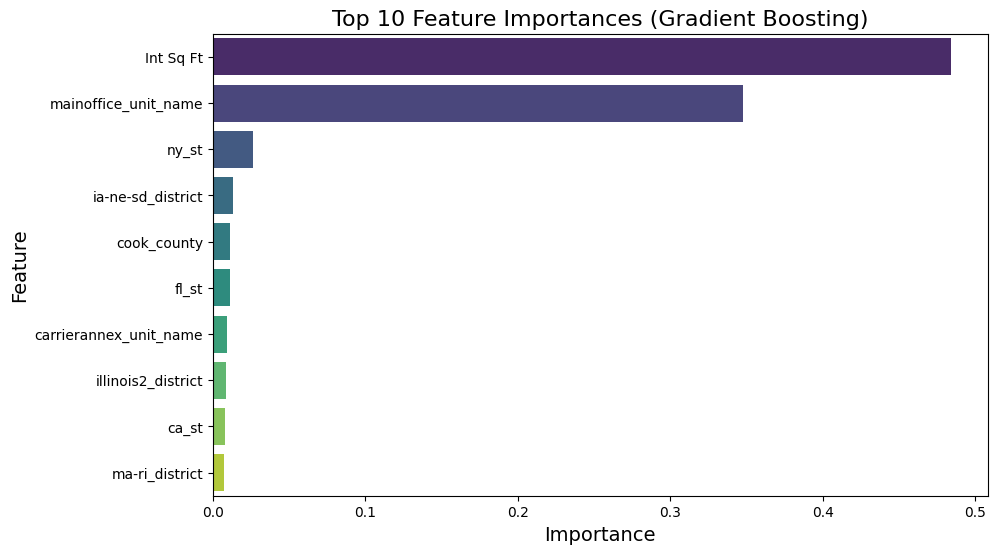

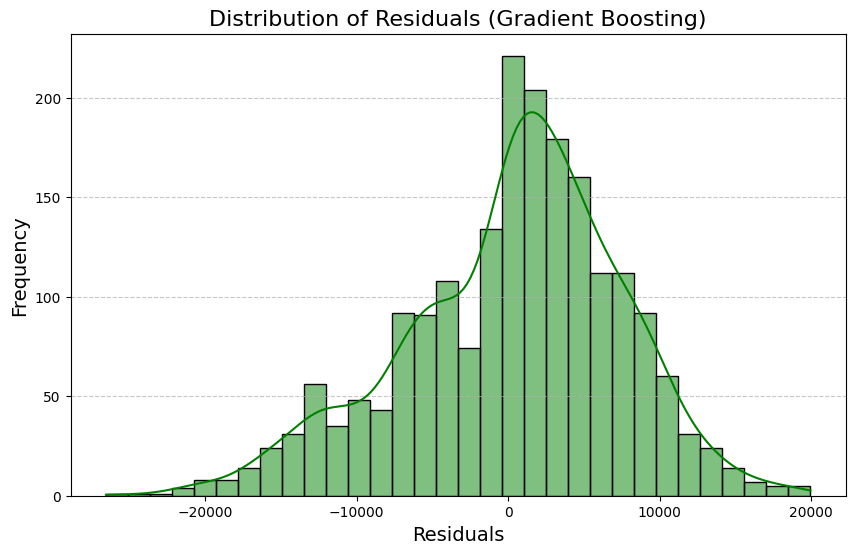

/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/3914408043.py:37: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



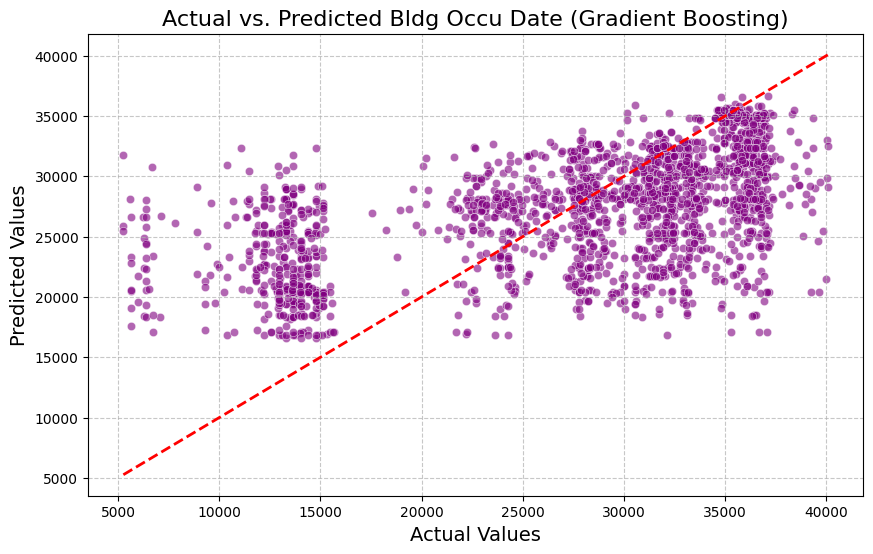

In [35]:
# Print all evaluation metrics
print("Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae_gb}")
print(f"Mean Squared Error (MSE): {mse_gb}")
print(f"Median Absolute Error: {median_ae_gb}")
print(f"Root Mean Squared Error (RMSE) {rmse_gb}")
print(f"Max Error: {max_err_gb}")
print(f"R2 Score: {r2_gb}")

# Plot feature importance
feature_importances_gb = pd.DataFrame({
    'Feature': X_gb.columns,
    'Importance': gb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importances_gb.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Feature Importances (Gradient Boosting)", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.show()

# Visualize residuals
residuals_gb = y_test_gb - y_pred_gb

plt.figure(figsize=(10, 6))
sns.histplot(residuals_gb, kde=True, color='green')
plt.title("Distribution of Residuals (Gradient Boosting)", fontsize=16)
plt.xlabel("Residuals", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test_gb, y=y_pred_gb, alpha=0.6, color='purple')
plt.plot([y_test_gb.min(), y_test_gb.max()], [y_test_gb.min(), y_test_gb.max()], 'k--', lw=2, color='red')
plt.title("Actual vs. Predicted Bldg Occu Date (Gradient Boosting)", fontsize=16)
plt.xlabel("Actual Values", fontsize=14)
plt.ylabel("Predicted Values", fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()

### Below uses R2 as the Scoring metric

In [36]:
# Create copies of the dataframe to avoid overwriting
X_gb = reduced_df.drop(columns=['Bldg Occu Date']).copy()  # Features
y_gb = reduced_df['Bldg Occu Date'].copy()  # Target variable

# Split the data into training and testing sets
X_train_gb, X_test_gb, y_train_gb, y_test_gb = train_test_split(X_gb, y_gb, test_size=0.25, random_state=42)

# Feature Engineering: Adding an interaction feature
X_train_gb['IntSqFt_Office_Interaction'] = X_train_gb['Int Sq Ft'] * X_train_gb['mainoffice_unit_name']
X_test_gb['IntSqFt_Office_Interaction'] = X_test_gb['Int Sq Ft'] * X_test_gb['mainoffice_unit_name']

# Initialize the Gradient Boosting model
gb_model = GradientBoostingRegressor(
    random_state=42,
    n_iter_no_change=10,  # Stop if no improvement in 10 rounds
    validation_fraction=0.1  # Use 10% of training data as validation set
)

# Expanded parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [500, 600, 1000],  # Added more options, especially for higher numbers
    'learning_rate': [0.01, 0.005],  # Added smaller learning rates
    'max_depth': [30, 40, 50, 90],  # Included more depth values
    'min_samples_split': [20, 50, 60, 90, 100],  # Added larger splits for highly imbalanced datasets
    'min_samples_leaf': [1, 2, 5, 10],  # Added smaller leaf sizes for more fine-grained trees
    'subsample': [1.0],  # Added intermediate values to subsample
    'max_features': ['sqrt', 'log2'],  # Added `None` for all features and a fixed ratio
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile']  # Explored different loss functions
}

# Perform GridSearchCV to find the best parameters
grid_search = GridSearchCV(
    gb_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='r2',  # Optimize for R-squared
    verbose=5,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train_gb, y_train_gb)

Fitting 5 folds for each of 3840 candidates, totalling 19200 fits
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=0.354 total time=   0.6s
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=0.354 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=0.323 total time=   0.7s
[CV 2/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=0.333 total time=   0.8s
[CV 4/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, 

GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(n_iter_no_change=10,
                                                 random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.005],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_depth': [30, 40, 50, 90],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [20, 50, 60, 90, 100],
                         'n_estimators': [500, 600, 1000], 'subsample': [1.0]},
             scoring='r2', verbose=5)

In [37]:
grid_search.best_params_

{'learning_rate': 0.005,
 'loss': 'squared_error',
 'max_depth': 30,
 'max_features': 'sqrt',
 'min_samples_leaf': 10,
 'min_samples_split': 100,
 'n_estimators': 1000,
 'subsample': 1.0}

Evaluation Metrics:
Mean Absolute Error (MAE): 5295.5337346429515
Mean Squared Error (MSE): 49673199.85859453
Root Mean Squared Error (RMSE): 7047.921669442314
Median Absolute Error: 3989.49511132943
Max Error: 27176.399051053017
R2 Score: 0.3490680510190355


/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/2386100298.py:35: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




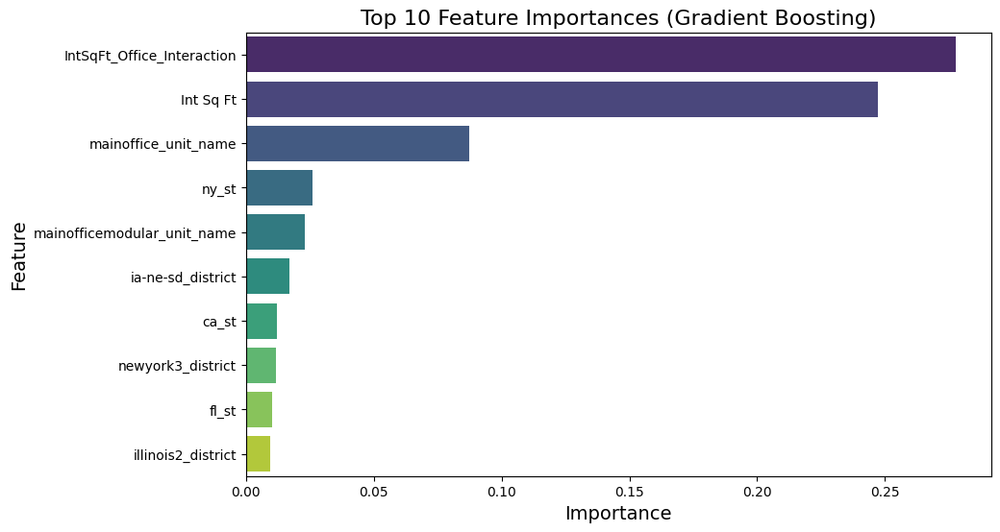

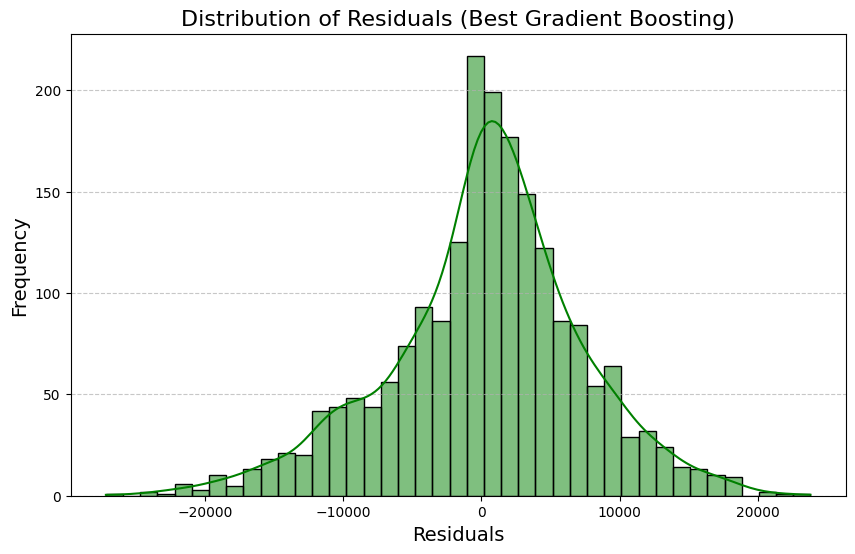

/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/2386100298.py:55: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



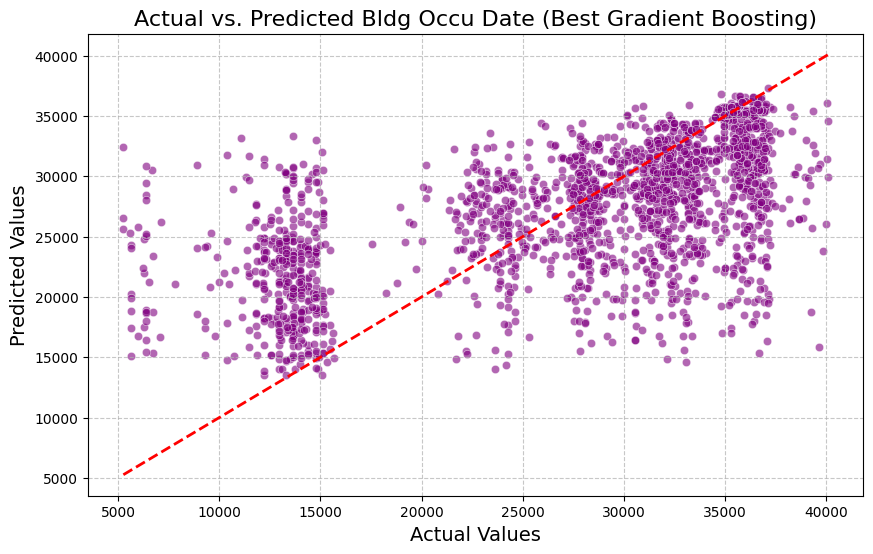

In [38]:
# Best parameters obtained from previous GridSearchCV
best_params = grid_search.best_params_

# Initialize GradientBoostingRegressor with the best parameters
best_gb_model = GradientBoostingRegressor(random_state=42, **best_params)

# Train and evaluate the model
best_gb_model.fit(X_train_gb, y_train_gb)
y_pred_gb = best_gb_model.predict(X_test_gb)

# Evaluate the model using multiple metrics
mae_gb = mean_absolute_error(y_test_gb, y_pred_gb)
mse_gb = mean_squared_error(y_test_gb, y_pred_gb)
rmse_gb = root_mean_squared_error(y_test_gb, y_pred_gb)  # Root Mean Squared Error
median_ae_gb = median_absolute_error(y_test_gb, y_pred_gb)
max_err_gb = max_error(y_test_gb, y_pred_gb)
r2_gb = r2_score(y_test_gb, y_pred_gb)

# Print all evaluation metrics
print("Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae_gb}")
print(f"Mean Squared Error (MSE): {mse_gb}")
print(f"Root Mean Squared Error (RMSE): {rmse_gb}")
print(f"Median Absolute Error: {median_ae_gb}")
print(f"Max Error: {max_err_gb}")
print(f"R2 Score: {r2_gb}")

# Plot feature importance
feature_importances_gb = pd.DataFrame({
    'Feature': X_train_gb.columns,
    'Importance': best_gb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importances_gb.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Feature Importances (Gradient Boosting)", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.show()

# Visualize residuals
residuals_gb = y_test_gb - y_pred_gb

plt.figure(figsize=(10, 6))
sns.histplot(residuals_gb, kde=True, color='green')
plt.title("Distribution of Residuals (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Residuals", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test_gb, y=y_pred_gb, alpha=0.6, color='purple')
plt.plot([y_test_gb.min(), y_test_gb.max()], [y_test_gb.min(), y_test_gb.max()], 'k--', lw=2, color='red')
plt.title("Actual vs. Predicted Bldg Occu Date (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Actual Values", fontsize=14)
plt.ylabel("Predicted Values", fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()


### Below uses neg_mean_absolute_error as the scoring metric

In [39]:
# Create copies of the dataframe to avoid overwriting
X_gb = reduced_df.drop(columns=['Bldg Occu Date']).copy()  # Features
y_gb = reduced_df['Bldg Occu Date'].copy()  # Target variable

# Split the data into training and testing sets
X_train_gb, X_test_gb, y_train_gb, y_test_gb = train_test_split(X_gb, y_gb, test_size=0.25, random_state=42)

# Feature Engineering: Adding an interaction feature
X_train_gb['IntSqFt_Office_Interaction'] = X_train_gb['Int Sq Ft'] * X_train_gb['mainoffice_unit_name']
X_test_gb['IntSqFt_Office_Interaction'] = X_test_gb['Int Sq Ft'] * X_test_gb['mainoffice_unit_name']

# Initialize the Gradient Boosting model
gb_model = GradientBoostingRegressor(
    random_state=42,
    n_iter_no_change=10,  # Stop if no improvement in 10 rounds
    validation_fraction=0.1  # Use 10% of training data as validation set
)
# Expanded parameter grid for GridSearchCV
#param_grid = {
#    'n_estimators': [100, 200, 500, 1000],  # Added more options, especially for higher numbers
#    'learning_rate': [0.1, 0.05, 0.01, 0.005],  # Added smaller learning rates
#    'max_depth': [3, 5, 10, 20, 30],  # Included more depth values
#    'min_samples_split': [2, 5, 10, 20, 50],  # Added larger splits for highly imbalanced datasets
#    'min_samples_leaf': [1, 2, 5, 10, 20, 50],  # Added smaller leaf sizes for more fine-grained trees
#    'subsample': [0.6, 0.7, 0.8, 0.9, 1.0],  # Added intermediate values to subsample
#    'max_features': ['sqrt', 'log2', None, 0.8],  # Added `None` for all features and a fixed ratio
#    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile']  # Explored different loss functions
#}

# Expanded parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [500, 600, 1000],  # Added more options, especially for higher numbers
    'learning_rate': [0.01, 0.005],  # Added smaller learning rates
    'max_depth': [30, 40, 50, 90],  # Included more depth values
    'min_samples_split': [20, 50, 60, 90, 100],  # Added larger splits for highly imbalanced datasets
    'min_samples_leaf': [1, 2, 5, 10],  # Added smaller leaf sizes for more fine-grained trees
    'subsample': [1.0],  # Added intermediate values to subsample
    'max_features': ['sqrt', 'log2'],  # Added `None` for all features and a fixed ratio
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile']  # Explored different loss functions
}


# Perform GridSearchCV to find the best parameters
grid_search = GridSearchCV(
    gb_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_mean_absolute_error',  # Optimize for R-squared
    verbose=5,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train_gb, y_train_gb)

Fitting 5 folds for each of 3840 candidates, totalling 19200 fits
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=-5443.264 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=-5686.451 total time=   0.6s
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=-5443.264 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=-5686.451 total time=   0.7s
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=1000,

GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(n_iter_no_change=10,
                                                 random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.005],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_depth': [30, 40, 50, 90],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [20, 50, 60, 90, 100],
                         'n_estimators': [500, 600, 1000], 'subsample': [1.0]},
             scoring='neg_mean_absolute_error', verbose=5)

In [40]:
grid_search.best_params_

{'learning_rate': 0.005,
 'loss': 'absolute_error',
 'max_depth': 30,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 60,
 'n_estimators': 1000,
 'subsample': 1.0}

Evaluation Metrics:
Mean Absolute Error (MAE): 5026.903100941423
Mean Squared Error (MSE): 53623286.00510658
Root Mean Squared Error (RMSE): 7322.7922273615395
Median Absolute Error: 3081.25529694945
Max Error: 26573.96433636127
R2 Score: 0.2973049819735264


/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/2386100298.py:35: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




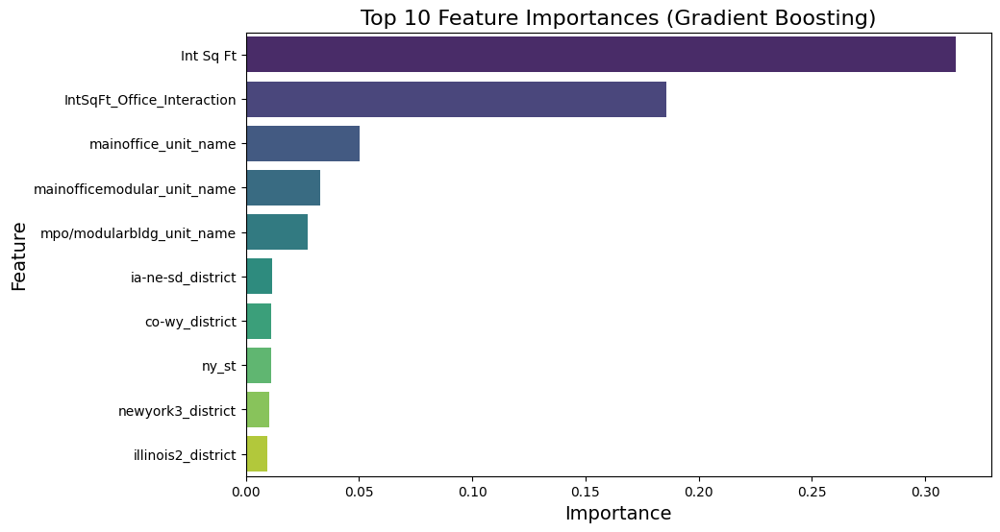

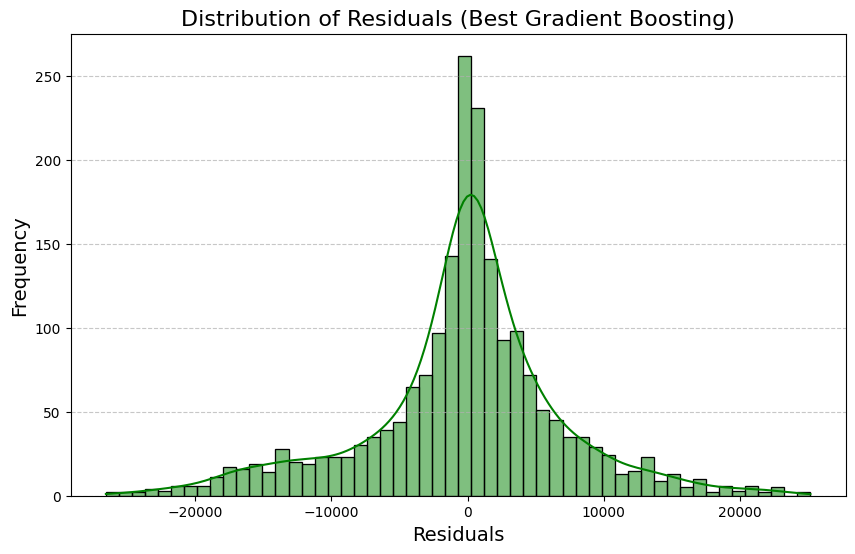

/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/2386100298.py:55: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



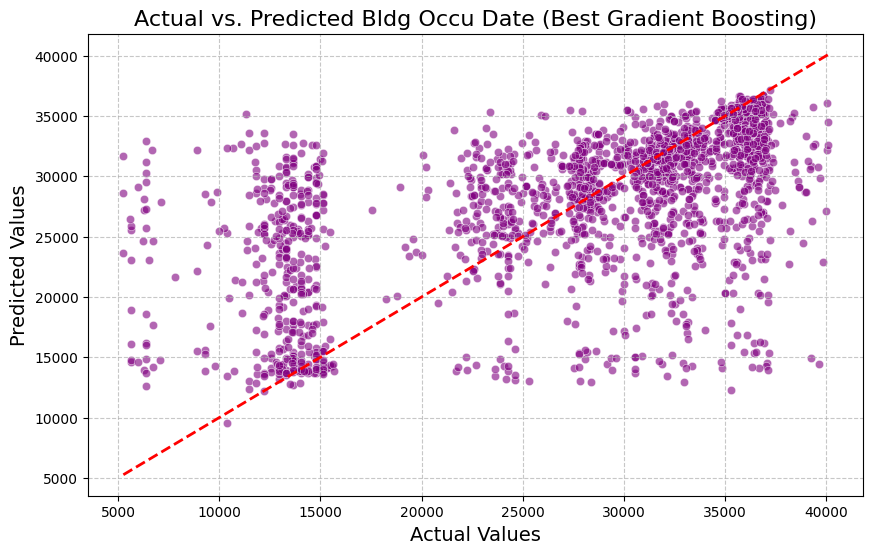

In [41]:
# Best parameters obtained from previous GridSearchCV
best_params = grid_search.best_params_

# Initialize GradientBoostingRegressor with the best parameters
best_gb_model = GradientBoostingRegressor(random_state=42, **best_params)

# Train and evaluate the model
best_gb_model.fit(X_train_gb, y_train_gb)
y_pred_gb = best_gb_model.predict(X_test_gb)

# Evaluate the model using multiple metrics
mae_gb = mean_absolute_error(y_test_gb, y_pred_gb)
mse_gb = mean_squared_error(y_test_gb, y_pred_gb)
rmse_gb = root_mean_squared_error(y_test_gb, y_pred_gb)  # Root Mean Squared Error
median_ae_gb = median_absolute_error(y_test_gb, y_pred_gb)
max_err_gb = max_error(y_test_gb, y_pred_gb)
r2_gb = r2_score(y_test_gb, y_pred_gb)

# Print all evaluation metrics
print("Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae_gb}")
print(f"Mean Squared Error (MSE): {mse_gb}")
print(f"Root Mean Squared Error (RMSE): {rmse_gb}")
print(f"Median Absolute Error: {median_ae_gb}")
print(f"Max Error: {max_err_gb}")
print(f"R2 Score: {r2_gb}")

# Plot feature importance
feature_importances_gb = pd.DataFrame({
    'Feature': X_train_gb.columns,
    'Importance': best_gb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importances_gb.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Feature Importances (Gradient Boosting)", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.show()

# Visualize residuals
residuals_gb = y_test_gb - y_pred_gb

plt.figure(figsize=(10, 6))
sns.histplot(residuals_gb, kde=True, color='green')
plt.title("Distribution of Residuals (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Residuals", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test_gb, y=y_pred_gb, alpha=0.6, color='purple')
plt.plot([y_test_gb.min(), y_test_gb.max()], [y_test_gb.min(), y_test_gb.max()], 'k--', lw=2, color='red')
plt.title("Actual vs. Predicted Bldg Occu Date (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Actual Values", fontsize=14)
plt.ylabel("Predicted Values", fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()


### Below is using max_error as the scoring metric

In [42]:
# Create copies of the dataframe to avoid overwriting
X_gb = reduced_df.drop(columns=['Bldg Occu Date']).copy()  # Features
y_gb = reduced_df['Bldg Occu Date'].copy()  # Target variable

# Split the data into training and testing sets
X_train_gb, X_test_gb, y_train_gb, y_test_gb = train_test_split(X_gb, y_gb, test_size=0.25, random_state=42)

# Feature Engineering: Adding an interaction feature
X_train_gb['IntSqFt_Office_Interaction'] = X_train_gb['Int Sq Ft'] * X_train_gb['mainoffice_unit_name']
X_test_gb['IntSqFt_Office_Interaction'] = X_test_gb['Int Sq Ft'] * X_test_gb['mainoffice_unit_name']

# Initialize the Gradient Boosting model
gb_model = GradientBoostingRegressor(
    random_state=42,
    n_iter_no_change=10,  # Stop if no improvement in 10 rounds
    validation_fraction=0.1  # Use 10% of training data as validation set
)

# Expanded parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [500, 600, 1000],  # Added more options, especially for higher numbers
    'learning_rate': [0.01, 0.005],  # Added smaller learning rates
    'max_depth': [30, 40, 50, 90],  # Included more depth values
    'min_samples_split': [20, 50, 60, 90, 100],  # Added larger splits for highly imbalanced datasets
    'min_samples_leaf': [1, 2, 5, 10],  # Added smaller leaf sizes for more fine-grained trees
    'subsample': [1.0],  # Added intermediate values to subsample
    'max_features': ['sqrt', 'log2'],  # Added `None` for all features and a fixed ratio
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile']  # Explored different loss functions
}


# Perform GridSearchCV to find the best parameters
grid_search = GridSearchCV(
    gb_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_max_error',  # Optimize for R-squared
    verbose=5,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train_gb, y_train_gb)


Fitting 5 folds for each of 3840 candidates, totalling 19200 fits
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=-25296.611 total time=   0.7s
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=-25296.611 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=-22721.552 total time=   0.7s
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=1000, subsample=1.0;, score=-25296.611 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=

GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(n_iter_no_change=10,
                                                 random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.005],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_depth': [30, 40, 50, 90],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [20, 50, 60, 90, 100],
                         'n_estimators': [500, 600, 1000], 'subsample': [1.0]},
             scoring='neg_max_error', verbose=5)

In [43]:
grid_search.best_params_

{'learning_rate': 0.005,
 'loss': 'squared_error',
 'max_depth': 30,
 'max_features': 'log2',
 'min_samples_leaf': 10,
 'min_samples_split': 100,
 'n_estimators': 500,
 'subsample': 1.0}

Evaluation Metrics:
Mean Absolute Error (MAE): 5544.655999940068
Mean Squared Error (MSE): 50187217.8588605
Root Mean Squared Error (RMSE): 7084.293744535195
Median Absolute Error: 4545.2846244830835
Max Error: 26445.45904609233
R2 Score: 0.3423322107736534


/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/2386100298.py:35: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




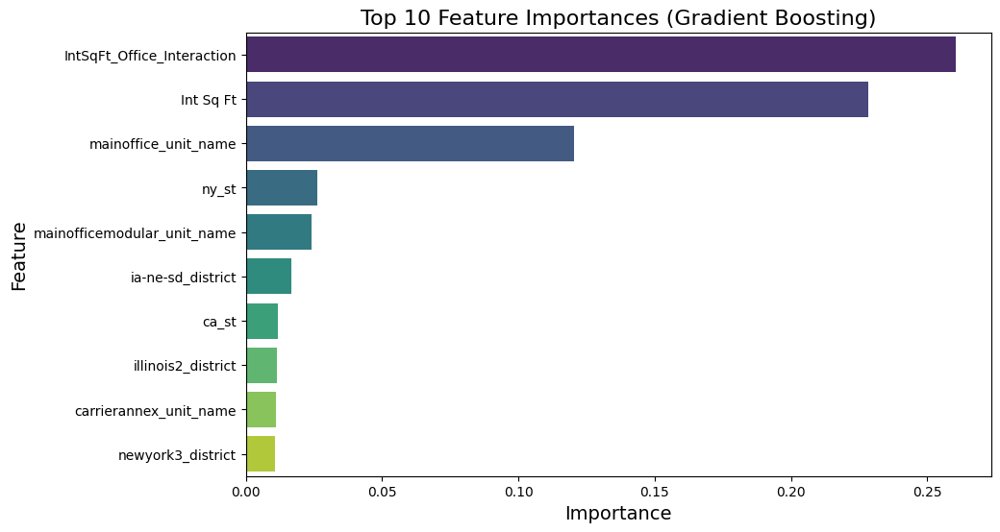

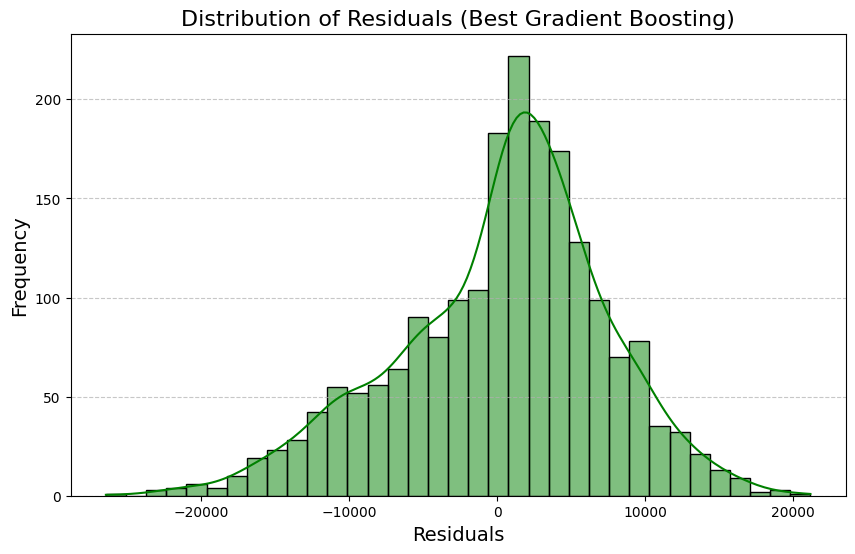

/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/2386100298.py:55: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



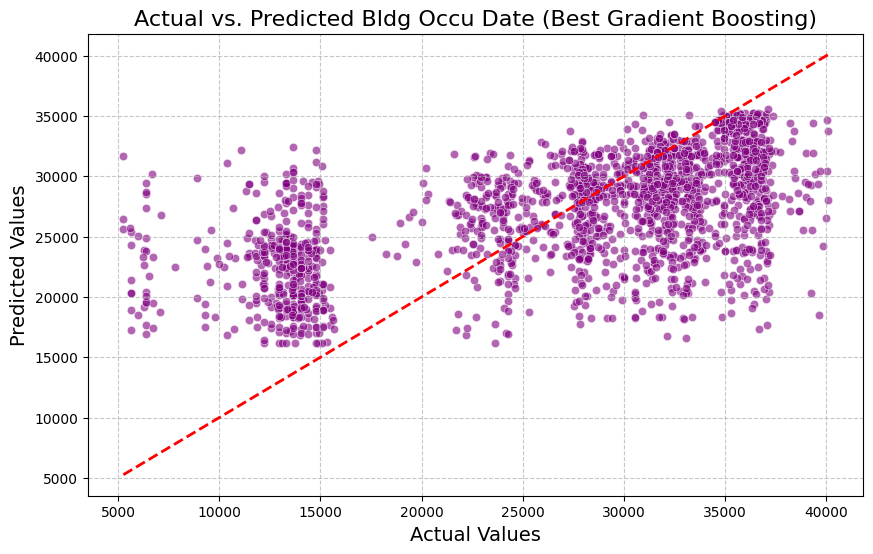

In [44]:
# Best parameters obtained from previous GridSearchCV
best_params = grid_search.best_params_

# Initialize GradientBoostingRegressor with the best parameters
best_gb_model = GradientBoostingRegressor(random_state=42, **best_params)

# Train and evaluate the model
best_gb_model.fit(X_train_gb, y_train_gb)
y_pred_gb = best_gb_model.predict(X_test_gb)

# Evaluate the model using multiple metrics
mae_gb = mean_absolute_error(y_test_gb, y_pred_gb)
mse_gb = mean_squared_error(y_test_gb, y_pred_gb)
rmse_gb = root_mean_squared_error(y_test_gb, y_pred_gb)  # Root Mean Squared Error
median_ae_gb = median_absolute_error(y_test_gb, y_pred_gb)
max_err_gb = max_error(y_test_gb, y_pred_gb)
r2_gb = r2_score(y_test_gb, y_pred_gb)

# Print all evaluation metrics
print("Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae_gb}")
print(f"Mean Squared Error (MSE): {mse_gb}")
print(f"Root Mean Squared Error (RMSE): {rmse_gb}")
print(f"Median Absolute Error: {median_ae_gb}")
print(f"Max Error: {max_err_gb}")
print(f"R2 Score: {r2_gb}")

# Plot feature importance
feature_importances_gb = pd.DataFrame({
    'Feature': X_train_gb.columns,
    'Importance': best_gb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importances_gb.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Feature Importances (Gradient Boosting)", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.show()

# Visualize residuals
residuals_gb = y_test_gb - y_pred_gb

plt.figure(figsize=(10, 6))
sns.histplot(residuals_gb, kde=True, color='green')
plt.title("Distribution of Residuals (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Residuals", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test_gb, y=y_pred_gb, alpha=0.6, color='purple')
plt.plot([y_test_gb.min(), y_test_gb.max()], [y_test_gb.min(), y_test_gb.max()], 'k--', lw=2, color='red')
plt.title("Actual vs. Predicted Bldg Occu Date (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Actual Values", fontsize=14)
plt.ylabel("Predicted Values", fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()


### Below is using neg_median_absolute_error as the scoring metric

In [45]:
# Create copies of the dataframe to avoid overwriting
X_gb = reduced_df.drop(columns=['Bldg Occu Date']).copy()  # Features
y_gb = reduced_df['Bldg Occu Date'].copy()  # Target variable

# Split the data into training and testing sets
X_train_gb, X_test_gb, y_train_gb, y_test_gb = train_test_split(X_gb, y_gb, test_size=0.25, random_state=42)

# Feature Engineering: Adding an interaction feature
X_train_gb['IntSqFt_Office_Interaction'] = X_train_gb['Int Sq Ft'] * X_train_gb['mainoffice_unit_name']
X_test_gb['IntSqFt_Office_Interaction'] = X_test_gb['Int Sq Ft'] * X_test_gb['mainoffice_unit_name']

# Initialize the Gradient Boosting model
gb_model = GradientBoostingRegressor(
    random_state=42,
    n_iter_no_change=10,  # Stop if no improvement in 10 rounds
    validation_fraction=0.1  # Use 10% of training data as validation set
)
# Expanded parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [500, 600, 1000],  # Added more options, especially for higher numbers
    'learning_rate': [0.01, 0.005],  # Added smaller learning rates
    'max_depth': [30, 40, 50, 90],  # Included more depth values
    'min_samples_split': [20, 50, 60, 90, 100],  # Added larger splits for highly imbalanced datasets
    'min_samples_leaf': [1, 2, 5, 10],  # Added smaller leaf sizes for more fine-grained trees
    'subsample': [1.0],  # Added intermediate values to subsample
    'max_features': ['sqrt', 'log2'],  # Added `None` for all features and a fixed ratio
    'loss': ['squared_error', 'absolute_error', 'huber', 'quantile']  # Explored different loss functions
}


# Perform GridSearchCV to find the best parameters
grid_search = GridSearchCV(
    gb_model,
    param_grid=param_grid,
    cv=5,  # 5-fold cross-validation
    scoring='neg_median_absolute_error',  # Optimize for R-squared
    verbose=5,
    n_jobs=-1
)

# Fit the model
grid_search.fit(X_train_gb, y_train_gb)


Fitting 5 folds for each of 3840 candidates, totalling 19200 fits
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500, subsample=1.0;, score=-4151.779 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=1000, subsample=1.0;, score=-4316.351 total time=   0.6s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=-4316.351 total time=   0.7s
[CV 3/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=600, subsample=1.0;, score=-4151.779 total time=   0.7s
[CV 5/5] END learning_rate=0.01, loss=squared_error, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20, n_estimators=500,

GridSearchCV(cv=5,
             estimator=GradientBoostingRegressor(n_iter_no_change=10,
                                                 random_state=42),
             n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.005],
                         'loss': ['squared_error', 'absolute_error', 'huber',
                                  'quantile'],
                         'max_depth': [30, 40, 50, 90],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 5, 10],
                         'min_samples_split': [20, 50, 60, 90, 100],
                         'n_estimators': [500, 600, 1000], 'subsample': [1.0]},
             scoring='neg_median_absolute_error', verbose=5)

In [46]:
grid_search.best_params_

{'learning_rate': 0.01,
 'loss': 'huber',
 'max_depth': 50,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 20,
 'n_estimators': 1000,
 'subsample': 1.0}

Evaluation Metrics:
Mean Absolute Error (MAE): 5837.433613887061
Mean Squared Error (MSE): 77148745.97453754
Root Mean Squared Error (RMSE): 8783.435886629875
Median Absolute Error: 3098.407068701388
Max Error: 28656.196576528782
R2 Score: -0.010979436025886802


/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/1661344288.py:36: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




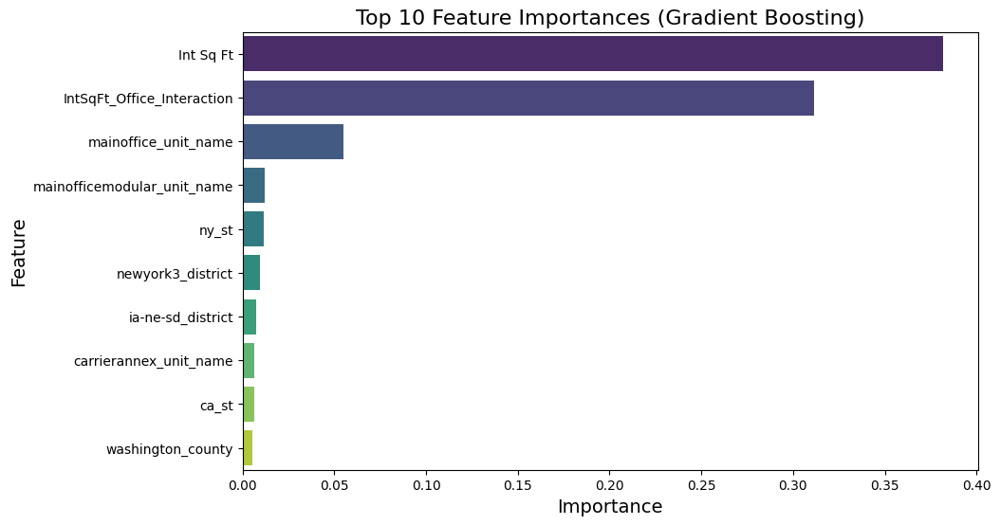

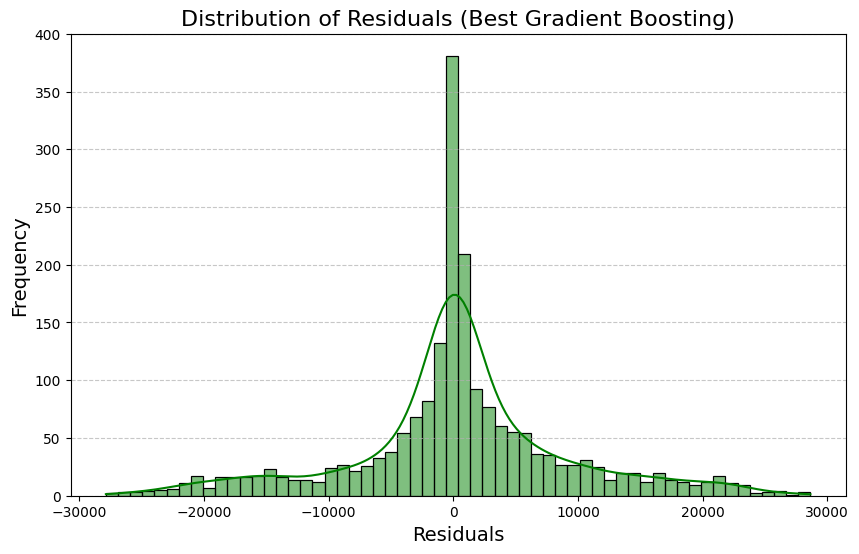

/var/folders/tk/pjnqp4tx1wz1_fkfd4dcpjdc0000gn/T/ipykernel_27746/1661344288.py:56: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



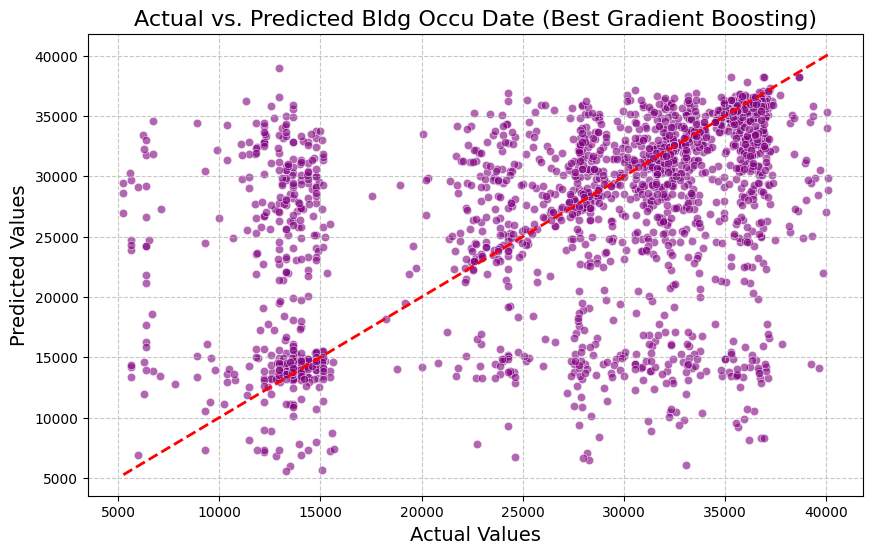

In [47]:
# Best parameters obtained from previous GridSearchCV
best_params = grid_search.best_params_

# Initialize GradientBoostingRegressor with the best parameters
best_gb_model = GradientBoostingRegressor(random_state=42, **best_params)

# Train and evaluate the model
best_gb_model.fit(X_train_gb, y_train_gb)
y_pred_gb = best_gb_model.predict(X_test_gb)

# Evaluate the model
# Evaluate the model using multiple metrics
mae_gb = mean_absolute_error(y_test_gb, y_pred_gb)
mse_gb = mean_squared_error(y_test_gb, y_pred_gb)
rmse_gb = root_mean_squared_error(y_test_gb, y_pred_gb)  # Root Mean Squared Error
median_ae_gb = median_absolute_error(y_test_gb, y_pred_gb)
max_err_gb = max_error(y_test_gb, y_pred_gb)
r2_gb = r2_score(y_test_gb, y_pred_gb)

# Print all evaluation metrics
print("Evaluation Metrics:")
print(f"Mean Absolute Error (MAE): {mae_gb}")
print(f"Mean Squared Error (MSE): {mse_gb}")
print(f"Root Mean Squared Error (RMSE): {rmse_gb}")
print(f"Median Absolute Error: {median_ae_gb}")
print(f"Max Error: {max_err_gb}")
print(f"R2 Score: {r2_gb}")

# Plot feature importance
feature_importances_gb = pd.DataFrame({
    'Feature': X_train_gb.columns,
    'Importance': best_gb_model.feature_importances_
}).sort_values(by='Importance', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(data=feature_importances_gb.head(10), x='Importance', y='Feature', palette='viridis')
plt.title("Top 10 Feature Importances (Gradient Boosting)", fontsize=16)
plt.xlabel("Importance", fontsize=14)
plt.ylabel("Feature", fontsize=14)
plt.show()

# Visualize residuals
residuals_gb = y_test_gb - y_pred_gb

plt.figure(figsize=(10, 6))
sns.histplot(residuals_gb, kde=True, color='green')
plt.title("Distribution of Residuals (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Residuals", fontsize=14)
plt.ylabel("Frequency", fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Scatter plot of actual vs. predicted values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test_gb, y=y_pred_gb, alpha=0.6, color='purple')
plt.plot([y_test_gb.min(), y_test_gb.max()], [y_test_gb.min(), y_test_gb.max()], 'k--', lw=2, color='red')
plt.title("Actual vs. Predicted Bldg Occu Date (Best Gradient Boosting)", fontsize=16)
plt.xlabel("Actual Values", fontsize=14)
plt.ylabel("Predicted Values", fontsize=14)
plt.grid(axis='both', linestyle='--', alpha=0.7)
plt.show()
